<a href="https://colab.research.google.com/github/jeraimondi/aai-cv-obj-detect-fashion/blob/main/Kayla_Yolov8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importing Libraries/Setting Data Path

In [1]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 646.0/646.0 kB 9.0 MB/s eta 0:00:00


In [2]:
import os
import cv2
import numpy as np
import random
import cv2
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
#from sklearn.metrics import confusion_matrix, plot_confusion_matrix
from tensorflow import keras
from tensorflow.keras import layers
from xml.etree import ElementTree as ET
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
from google.colab import drive
import shutil
import tqdm
from ultralytics import YOLO
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [3]:
images_path = '/content/drive/MyDrive/colorful_fashion_dataset_for_object_detection/JPEGImages/'
annotations_path = '/content/drive/MyDrive/colorful_fashion_dataset_for_object_detection/Annotations_txt/'
file_path = '/content/drive/MyDrive/colorful_fashion_dataset_for_object_detection'

# Graphing 6 Random Images

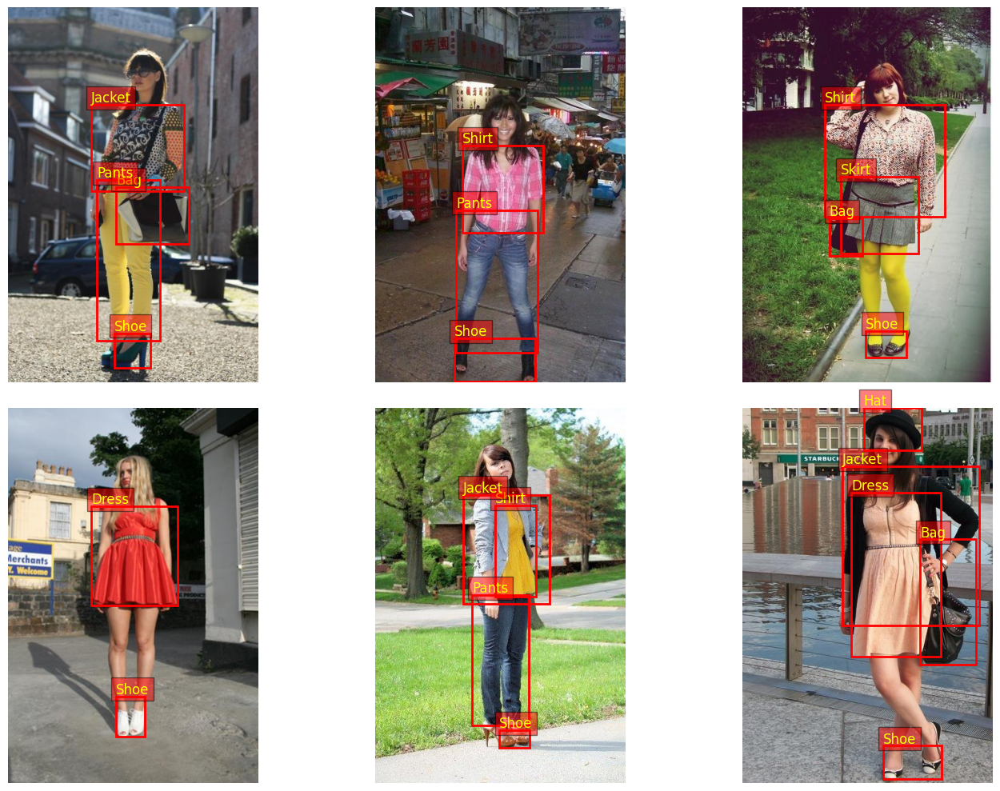

In [4]:
class_id_to_name = {
    0: "Sunglass",
    1: "Hat",
    2: "Jacket",
    3: "Shirt",
    4: "Pants",
    5: "Shorts",
    6: "Skirt",
    7: "Dress",
    8: "Bag",
    9: "Shoe"
}


def plot_images_with_annotations(image_paths, annotation_paths, num_images=6):
    # Set up the subplot dimensions as 2 rows and 3 columns
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))  # Adjust the figsize
    axes = axes.flatten()

    for ax, image_path, annotation_path in zip(axes, image_paths, annotation_paths):
        # Read the image
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB

        # Load the annotations
        with open(annotation_path, 'r') as file:
            annotations = file.readlines()

        # Plot the image
        ax.imshow(image)

        # Plot each bounding box and class ID
        for annotation in annotations:
            class_id, x_center, y_center, width, height = map(float, annotation.split())
            # Convert normalized coordinates to pixel values
            x_center, y_center, width, height = (x_center * image.shape[1], y_center * image.shape[0],
                                                 width * image.shape[1], height * image.shape[0])
            xmin = int(x_center - width / 2)
            ymin = int(y_center - height / 2)
            xmax = int(x_center + width / 2)
            ymax = int(y_center + height / 2)

            # Draw the bounding box
            rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

            # Display the class ID or name
            class_name = class_id_to_name.get(class_id, f"Class{int(class_id)}")
            ax.text(xmin, ymin - 5, class_name, color='yellow', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

        # Hide the axes
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# List all images and annotations
image_files = os.listdir(images_path)
annotation_files = os.listdir(annotations_path)

# Select five random images and their corresponding annotations
random_image_names = random.sample(image_files, 6)
random_image_paths = [os.path.join(images_path, img_name) for img_name in random_image_names]
random_annotation_paths = [os.path.join(annotations_path, img_name.replace('.jpg', '.txt')) for img_name in random_image_names]

# Plot the images with annotations
plot_images_with_annotations(random_image_paths, random_annotation_paths)

# Train/Test Initialization

In [5]:
# Initializing Train and Test Sets
train_set = []
with open(file_path + '/ImageSets/Main/trainval.txt', 'r') as train:
    for line in train.readlines():
      line = line[:-1]
      train_set.append(line)

test_set = []
with open(file_path + '/ImageSets/Main/test.txt', 'r') as test:
  for line in test.readlines():
      line = line[:-1]
      test_set.append(line)

In [6]:
print("Length of train set:", len(train_set))
print("Length of test set:", len(test_set))

Length of train set: 2144
Length of test set: 537


In [8]:
# Making paths for train/test
base_path = '/content/drive/My Drive/YoloProject/'

os.mkdir(base_path + 'train')
os.mkdir(base_path + 'train/images')
os.mkdir(base_path + 'train/labels')

os.mkdir(base_path + 'test')
os.mkdir(base_path + 'test/images')
os.mkdir(base_path + 'test/labels')

train_location = base_path + 'train/'
test_location = base_path + 'test/'

In [10]:
for i in tqdm.tqdm(train_set):
    try:
        x = shutil.copyfile(images_path + i + '.jpg', train_location + 'images/' + i + '.jpg')
        x = shutil.copyfile(annotations_path + i + '.txt', train_location + 'labels/' + i + '.txt')
    except FileNotFoundError as e:
        print(f"File not found: {e}")

100%|██████████| 2144/2144 [17:13<00:00,  2.07it/s]

File not found: [Errno 2] No such file or directory: '/content/drive/MyDrive/colorful_fashion_dataset_for_object_detection/JPEGImages/10255.jpg'


In [11]:
for i in tqdm.tqdm(test_set):
    try:
      x = shutil.copyfile(images_path + i + '.jpg', test_location + 'images/' + i + '.jpg')
      x = shutil.copyfile(annotations_path + i + '.txt', test_location + 'labels/' + i + '.txt')
    except FileNotFoundError as e:
        print(f"File not found: {e}")

100%|██████████| 537/537 [04:10<00:00,  2.14it/s]

File not found: [Errno 2] No such file or directory: '/content/drive/MyDrive/colorful_fashion_dataset_for_object_detection/JPEGImages/24.jpg'


# Training and Evaluating

In [12]:
text_file = '''

train: '/content/drive/My Drive/YoloProject/train'
val: '/content/drive/My Drive/YoloProject/test'

nc: 10
names: ['sunglass', 'hat', 'jacket', 'shirt', 'pants', 'shorts', 'skirt', 'dress', 'bag', 'shoe']
'''

with open('/content/drive/My Drive/YoloProject/data1.yaml', 'w') as f:
  f.write(text_file)

In [13]:
yolo1 = YOLO('yolov8m.pt')
yolo1.train(data='/content/drive/My Drive/YoloProject/data1.yaml', epochs=100)

100%|██████████| 49.7M/49.7M [00:00<00:00, 392MB/s]


Ultralytics YOLOv8.0.220 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/drive/My Drive/YoloProject/data1.yaml, epochs=10, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True

100%|██████████| 755k/755k [00:00<00:00, 42.3MB/s]

Overriding model.yaml nc=80 with nc=10

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytic

 15                  -1  2    517632  ultralytics.nn.modules.block.C2f             [576, 192, 2]                 
 16                  -1  1    332160  ultralytics.nn.modules.conv.Conv             [192, 192, 3, 2]              
 17            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 18                  -1  2   1846272  ultralytics.nn.modules.block.C2f             [576, 384, 2]                 
 19                  -1  1   1327872  ultralytics.nn.modules.conv.Conv             [384, 384, 3, 2]              
 20             [-1, 9]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 21                  -1  2   4207104  ultralytics.nn.modules.block.C2f             [960, 576, 2]                 
 22        [15, 18, 21]  1   3781486  ultralytics.nn.modules.head.Detect           [10, [192, 384, 576]]         
Model summary: 295 layers, 25862110 parameters, 25862094 gradients, 79.1 GFLOPs

Transfe

100%|██████████| 6.23M/6.23M [00:00<00:00, 200MB/s]


WARNING ⚠️ NMS time limit 0.550s exceeded
AMP: checks passed ✅


train: Scanning /content/drive/My Drive/YoloProject/train/labels... 2143 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2143/2143 [00:04<00:00, 455.30it/s]


train: New cache created: /content/drive/My Drive/YoloProject/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/My Drive/YoloProject/test/labels... 536 images, 0 backgrounds, 0 corrupt: 100%|██████████| 536/536 [00:01<00:00, 300.78it/s]


val: New cache created: /content/drive/My Drive/YoloProject/test/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      6.95G      1.333      2.066      1.455         50        640: 100%|██████████| 134/134 [00:31<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.27it/s]

                   all        536       2031      0.589      0.624      0.632      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      7.18G      1.305      1.328      1.402         50        640: 100%|██████████| 134/134 [00:25<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.34it/s]


                   all        536       2031      0.618      0.647      0.675      0.402

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      7.18G      1.293      1.262      1.402         51        640: 100%|██████████| 134/134 [00:25<00:00,  5.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.52it/s]


                   all        536       2031      0.661      0.668      0.683      0.426

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      7.19G      1.285      1.169      1.388         53        640: 100%|██████████| 134/134 [00:25<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.45it/s]


                   all        536       2031      0.673      0.658      0.667       0.42

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      7.18G      1.248      1.126      1.375         54        640: 100%|██████████| 134/134 [00:25<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.63it/s]


                   all        536       2031      0.742      0.678      0.725       0.46

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      7.19G      1.201      1.052      1.334         56        640: 100%|██████████| 134/134 [00:25<00:00,  5.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.52it/s]


                   all        536       2031      0.722       0.73      0.748      0.488

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10       7.2G      1.166     0.9774       1.32         54        640: 100%|██████████| 134/134 [00:24<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.77it/s]


                   all        536       2031      0.752      0.718      0.752      0.497

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      7.21G      1.109     0.9053      1.277         59        640: 100%|██████████| 134/134 [00:25<00:00,  5.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.55it/s]


                   all        536       2031      0.716      0.728      0.758      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      7.18G      1.074     0.8341      1.257         55        640: 100%|██████████| 134/134 [00:25<00:00,  5.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.73it/s]

                   all        536       2031      0.746       0.76      0.777      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10       7.2G      1.038     0.7753      1.232         54        640: 100%|██████████| 134/134 [00:25<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.66it/s]


                   all        536       2031      0.741      0.778      0.789      0.544

10 epochs completed in 0.089 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train/weights/best.pt, 52.0MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.0.220 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 218 layers, 25845550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:07<00:00,  2.37it/s]


                   all        536       2031      0.741      0.778      0.789      0.545
            Sunglasses        536         82      0.678      0.206      0.343      0.127
                   Hat        536         76      0.783      0.807      0.819      0.511
                Jacket        536        181      0.766       0.79      0.866      0.676
                 Shirt        536        365      0.739      0.871       0.85      0.614
                 Pants        536        114      0.849       0.93      0.957      0.773
                Shorts        536        107      0.768      0.869      0.833       0.56
                 Skirt        536        185      0.703      0.859      0.821      0.643
                 Dress        536        128      0.635      0.911      0.825      0.659
                   Bag        536        274      0.683      0.715      0.739      0.408
                  Shoe        536        519      0.801      0.817      0.835      0.476
Speed: 0.1ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ee7cb60c580>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0

In [18]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [30]:
yolo1.val()

Ultralytics YOLOv8.0.220 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)


val: Scanning /content/drive/My Drive/YoloProject/test/labels.cache... 536 images, 0 backgrounds, 0 corrupt: 100%|██████████| 536/536 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:10<00:00,  3.32it/s]


                   all        536       2031      0.741      0.777      0.788      0.544
            Sunglasses        536         82      0.677      0.204      0.342      0.127
                   Hat        536         76      0.783      0.806       0.82      0.511
                Jacket        536        181      0.766       0.79      0.866      0.675
                 Shirt        536        365      0.741      0.871      0.849      0.613
                 Pants        536        114      0.856       0.93      0.957      0.772
                Shorts        536        107      0.768      0.869      0.832      0.558
                 Skirt        536        185        0.7      0.857       0.82      0.641
                 Dress        536        128      0.635      0.911      0.825      0.659
                   Bag        536        274      0.684      0.715      0.738      0.408
                  Shoe        536        519      0.799      0.817      0.833      0.477
Speed: 0.1ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ee59626a380>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0


image 1/1 /content/drive/MyDrive/people.jpg: 448x640 5 Jackets, 1 Shirt, 2 Pantss, 1 Dress, 2 Shoes, 20.9ms
Speed: 4.4ms preprocess, 20.9ms inference, 2.3ms postprocess per image at shape (1, 3, 448, 640)


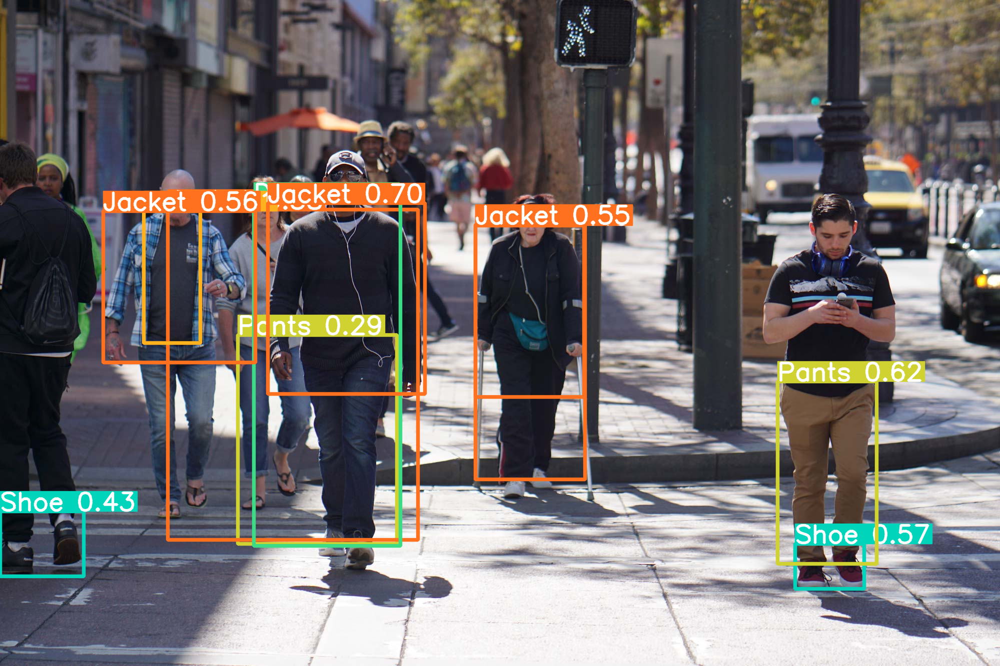

In [34]:
from PIL import Image
results1 = yolo1("/content/drive/MyDrive/people.jpg")
for r in results1:
    im_array = r.plot()
    im = Image.fromarray(im_array[..., ::-1])
    display(im)

In [40]:
yolo2 = YOLO('yolov8m.pt')
yolo2.train(data='/content/drive/My Drive/YoloProject/data1.yaml', epochs=30)

Ultralytics YOLOv8.0.220 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/drive/My Drive/YoloProject/data1.yaml, epochs=30, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train7, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=Tru

train: Scanning /content/drive/My Drive/YoloProject/train/labels.cache... 2143 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2143/2143 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/My Drive/YoloProject/test/labels.cache... 536 images, 0 backgrounds, 0 corrupt: 100%|██████████| 536/536 [00:00<?, ?it/s]


Plotting labels to runs/detect/train7/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train7
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      7.58G      1.302       1.83      1.425        117        640: 100%|██████████| 134/134 [00:30<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  4.24it/s]


                   all        536       2031       0.58      0.633      0.626      0.381

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      8.45G       1.25      1.261      1.376         88        640: 100%|██████████| 134/134 [00:27<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.39it/s]


                   all        536       2031      0.653      0.683      0.706      0.443

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      8.46G      1.255      1.201      1.383        103        640: 100%|██████████| 134/134 [00:26<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.41it/s]


                   all        536       2031      0.575      0.683      0.677      0.408

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      8.44G      1.256      1.169      1.391         98        640: 100%|██████████| 134/134 [00:25<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.65it/s]


                   all        536       2031       0.64      0.704      0.694      0.434

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      8.46G      1.246      1.124      1.386        122        640: 100%|██████████| 134/134 [00:25<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  4.22it/s]


                   all        536       2031      0.689      0.687      0.723      0.465

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      8.46G      1.218      1.071      1.361        112        640: 100%|██████████| 134/134 [00:25<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.60it/s]


                   all        536       2031       0.69       0.72      0.723      0.464

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      8.45G        1.2      1.042      1.358        144        640: 100%|██████████| 134/134 [00:26<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.44it/s]


                   all        536       2031      0.743      0.723      0.755       0.49

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      8.45G      1.174     0.9978      1.346        140        640: 100%|██████████| 134/134 [00:25<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.41it/s]


                   all        536       2031      0.736        0.7       0.75      0.491

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      8.45G      1.166     0.9792      1.334         85        640: 100%|██████████| 134/134 [00:26<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.32it/s]


                   all        536       2031      0.695       0.74      0.747      0.497

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      8.47G      1.136     0.9404      1.325        124        640: 100%|██████████| 134/134 [00:25<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.57it/s]


                   all        536       2031       0.71      0.762      0.766      0.505

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      8.46G      1.123     0.9137      1.305        120        640: 100%|██████████| 134/134 [00:26<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.60it/s]


                   all        536       2031      0.733      0.728      0.752      0.506

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      8.46G      1.098     0.8745      1.291        104        640: 100%|██████████| 134/134 [00:25<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.44it/s]


                   all        536       2031      0.739      0.751      0.778      0.526

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      8.46G      1.091      0.871      1.294        102        640: 100%|██████████| 134/134 [00:25<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.49it/s]

                   all        536       2031      0.753      0.759      0.777      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      8.46G      1.068      0.828      1.272        100        640: 100%|██████████| 134/134 [00:25<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.57it/s]


                   all        536       2031       0.73      0.742      0.771      0.523

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      8.46G       1.05       0.81      1.255        122        640: 100%|██████████| 134/134 [00:26<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.48it/s]


                   all        536       2031      0.727      0.769       0.78      0.535

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      8.46G      1.041     0.7877      1.248         82        640: 100%|██████████| 134/134 [00:25<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.48it/s]


                   all        536       2031      0.752      0.774      0.784      0.531

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      8.46G      1.019      0.772      1.235        107        640: 100%|██████████| 134/134 [00:26<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.62it/s]


                   all        536       2031      0.736      0.776      0.793      0.541

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      8.48G      1.003     0.7508      1.225         84        640: 100%|██████████| 134/134 [00:25<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.60it/s]


                   all        536       2031      0.794      0.733      0.786       0.54

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      8.46G     0.9985     0.7243      1.223        155        640: 100%|██████████| 134/134 [00:26<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.50it/s]


                   all        536       2031      0.761      0.761      0.783      0.536

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      8.47G     0.9904     0.7098      1.217         93        640: 100%|██████████| 134/134 [00:25<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.63it/s]


                   all        536       2031      0.763      0.767      0.788      0.534
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      8.45G       0.94      0.632      1.202         53        640: 100%|██████████| 134/134 [00:28<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.57it/s]


                   all        536       2031      0.743      0.784      0.793      0.542

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      8.48G     0.9278     0.6153      1.191         57        640: 100%|██████████| 134/134 [00:25<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.30it/s]


                   all        536       2031      0.748      0.774      0.794      0.543

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      8.46G      0.903     0.5946      1.178         56        640: 100%|██████████| 134/134 [00:25<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.49it/s]


                   all        536       2031      0.739       0.77      0.781      0.541

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      8.47G     0.8877     0.5688      1.167         57        640: 100%|██████████| 134/134 [00:25<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.54it/s]


                   all        536       2031      0.733      0.767      0.778      0.539

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      8.46G     0.8765     0.5484      1.158         54        640: 100%|██████████| 134/134 [00:25<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.62it/s]


                   all        536       2031      0.801      0.771      0.802       0.55

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      8.49G     0.8552     0.5224       1.14         57        640: 100%|██████████| 134/134 [00:25<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.27it/s]


                   all        536       2031      0.726      0.777      0.782      0.539

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      8.45G     0.8333      0.511      1.132         60        640: 100%|██████████| 134/134 [00:25<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.63it/s]

                   all        536       2031      0.744      0.779      0.793       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      8.48G     0.8264      0.491      1.118         49        640: 100%|██████████| 134/134 [00:25<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.51it/s]


                   all        536       2031      0.762      0.778      0.798      0.548

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      8.46G      0.807     0.4755      1.112         54        640: 100%|██████████| 134/134 [00:25<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.54it/s]


                   all        536       2031      0.743      0.776      0.792       0.55

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      8.47G     0.7919     0.4639      1.101         50        640: 100%|██████████| 134/134 [00:25<00:00,  5.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.34it/s]


                   all        536       2031      0.755      0.776      0.796      0.551

30 epochs completed in 0.262 hours.
Optimizer stripped from runs/detect/train7/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train7/weights/best.pt, 52.0MB

Validating runs/detect/train7/weights/best.pt...
Ultralytics YOLOv8.0.220 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 218 layers, 25845550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:07<00:00,  2.38it/s]


                   all        536       2031      0.756      0.776      0.797      0.551
            Sunglasses        536         82      0.527      0.299      0.404      0.152
                   Hat        536         76       0.76      0.835      0.805      0.491
                Jacket        536        181       0.78      0.822      0.853      0.678
                 Shirt        536        365      0.789       0.86      0.863      0.638
                 Pants        536        114      0.907      0.921      0.949      0.765
                Shorts        536        107      0.776      0.813      0.802      0.521
                 Skirt        536        185      0.783      0.818      0.843      0.671
                 Dress        536        128      0.689      0.844      0.846      0.679
                   Bag        536        274      0.737      0.726      0.763      0.433
                  Shoe        536        519      0.814      0.817      0.838      0.484
Speed: 0.1ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ee59872bd00>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0

In [41]:
yolo2.val()

Ultralytics YOLOv8.0.220 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 218 layers, 25845550 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /content/drive/My Drive/YoloProject/test/labels.cache... 536 images, 0 backgrounds, 0 corrupt: 100%|██████████| 536/536 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:09<00:00,  3.48it/s]


                   all        536       2031      0.752      0.776      0.795      0.551
            Sunglasses        536         82      0.509      0.291      0.391       0.15
                   Hat        536         76      0.761      0.837      0.805      0.491
                Jacket        536        181      0.777      0.823      0.853      0.677
                 Shirt        536        365      0.784       0.86      0.863      0.637
                 Pants        536        114      0.897      0.921      0.949      0.766
                Shorts        536        107      0.775      0.813      0.802      0.519
                 Skirt        536        185      0.784      0.822      0.843       0.67
                 Dress        536        128      0.689      0.844      0.846      0.681
                   Bag        536        274      0.734      0.726      0.763      0.433
                  Shoe        536        519      0.813      0.821       0.84      0.486
Speed: 0.2ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ee7d0f92320>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0


image 1/1 /content/drive/MyDrive/people.jpg: 448x640 3 Jackets, 3 Shirts, 2 Pantss, 3 Shoes, 16.3ms
Speed: 2.7ms preprocess, 16.3ms inference, 2.3ms postprocess per image at shape (1, 3, 448, 640)


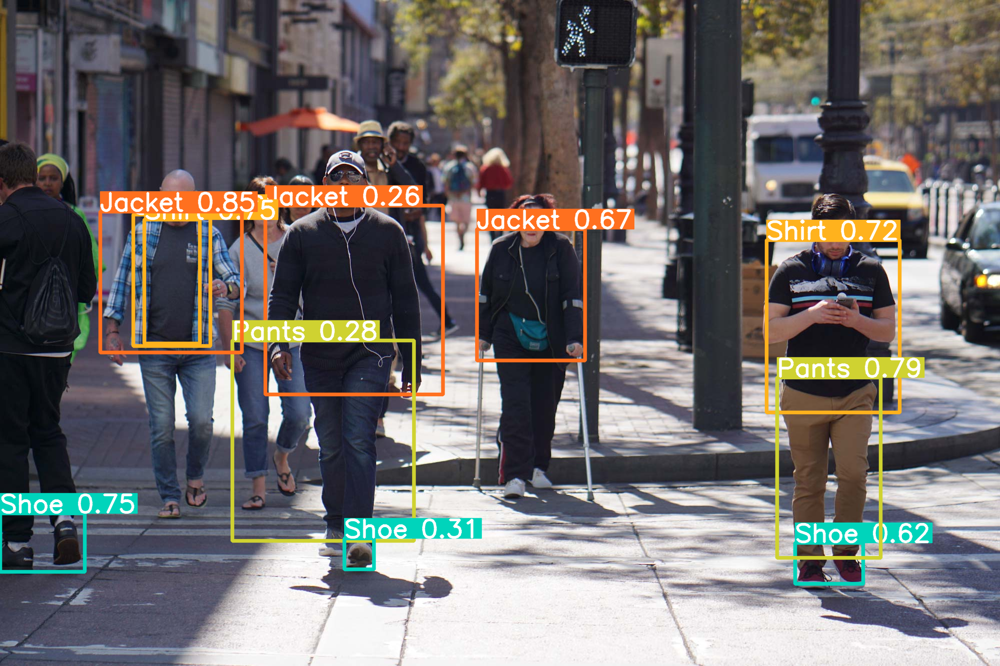

In [42]:
from PIL import Image
results2 = yolo2("/content/drive/MyDrive/people.jpg")
for r in results2:
    im_array = r.plot()
    im = Image.fromarray(im_array[..., ::-1])
    display(im)

In [43]:
augmentation = '''
train: '/content/drive/My Drive/YoloProject/train'
val: '/content/drive/My Drive/YoloProject/test'

nc: 10
names: ['sunglass', 'hat', 'jacket', 'shirt', 'pants', 'shorts', 'skirt', 'dress', 'bag', 'shoe']

# Data Augmentation Parameters
augment:
  hue: 0.1
  saturation: 1.5
  exposure: 1.5
  mosaic: true
  mixup: true
  flipud: 0.5  # Probability of vertical flip
  fliplr: 0.5  # Probability of horizontal flip
  rotate: 10.0  # Rotate images within +/- 10 degrees
  '''

with open('/content/drive/My Drive/YoloProject/data2.yaml', 'w') as f:
  f.write(augmentation)

In [44]:
yolo3 = YOLO('yolov8m.pt')
yolo3.train(data='/content/drive/My Drive/YoloProject/data2.yaml', epochs=30)

Ultralytics YOLOv8.0.220 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/drive/My Drive/YoloProject/data2.yaml, epochs=30, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train8, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=Tru

train: Scanning /content/drive/My Drive/YoloProject/train/labels.cache... 2143 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2143/2143 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/My Drive/YoloProject/test/labels.cache... 536 images, 0 backgrounds, 0 corrupt: 100%|██████████| 536/536 [00:00<?, ?it/s]


Plotting labels to runs/detect/train8/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train8
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      8.84G      1.302       1.83      1.425        117        640: 100%|██████████| 134/134 [00:31<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  4.14it/s]

                   all        536       2031       0.58      0.633      0.626      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      9.04G       1.25      1.261      1.376         88        640: 100%|██████████| 134/134 [00:27<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.31it/s]


                   all        536       2031      0.653      0.683      0.706      0.443

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      9.06G      1.255      1.201      1.383        103        640: 100%|██████████| 134/134 [00:27<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  4.13it/s]

                   all        536       2031      0.575      0.683      0.677      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30       8.9G      1.256      1.169      1.391         98        640: 100%|██████████| 134/134 [00:26<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.33it/s]


                   all        536       2031       0.64      0.704      0.694      0.434

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      9.07G      1.246      1.124      1.386        122        640: 100%|██████████| 134/134 [00:26<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.39it/s]


                   all        536       2031      0.689      0.687      0.723      0.465

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      8.91G      1.218      1.071      1.361        112        640: 100%|██████████| 134/134 [00:26<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.48it/s]


                   all        536       2031       0.69       0.72      0.723      0.464

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      8.91G        1.2      1.042      1.358        144        640: 100%|██████████| 134/134 [00:26<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.48it/s]


                   all        536       2031      0.743      0.723      0.755       0.49

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      9.07G      1.174     0.9978      1.346        140        640: 100%|██████████| 134/134 [00:26<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.28it/s]


                   all        536       2031      0.736        0.7       0.75      0.491

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30       8.9G      1.166     0.9792      1.334         85        640: 100%|██████████| 134/134 [00:26<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.61it/s]


                   all        536       2031      0.695       0.74      0.747      0.497

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      9.08G      1.136     0.9404      1.325        124        640: 100%|██████████| 134/134 [00:26<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  4.15it/s]

                   all        536       2031       0.71      0.762      0.766      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      8.92G      1.123     0.9137      1.305        120        640: 100%|██████████| 134/134 [00:26<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.57it/s]


                   all        536       2031      0.733      0.728      0.752      0.506

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      8.94G      1.098     0.8745      1.291        104        640: 100%|██████████| 134/134 [00:26<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  4.06it/s]

                   all        536       2031      0.739      0.751      0.778      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      9.07G      1.091      0.871      1.294        102        640: 100%|██████████| 134/134 [00:26<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.62it/s]


                   all        536       2031      0.753      0.759      0.777      0.519

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      8.91G      1.068      0.828      1.272        100        640: 100%|██████████| 134/134 [00:26<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.35it/s]


                   all        536       2031       0.73      0.742      0.771      0.523

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      8.93G       1.05       0.81      1.255        122        640: 100%|██████████| 134/134 [00:26<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.50it/s]

                   all        536       2031      0.727      0.769       0.78      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      9.09G      1.041     0.7877      1.248         82        640: 100%|██████████| 134/134 [00:26<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.37it/s]


                   all        536       2031      0.752      0.774      0.784      0.531

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      9.06G      1.019      0.772      1.235        107        640: 100%|██████████| 134/134 [00:26<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  4.23it/s]


                   all        536       2031      0.736      0.776      0.793      0.541

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      9.07G      1.003     0.7508      1.225         84        640: 100%|██████████| 134/134 [00:27<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.60it/s]


                   all        536       2031      0.794      0.733      0.786       0.54

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      8.92G     0.9985     0.7243      1.223        155        640: 100%|██████████| 134/134 [00:26<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  4.18it/s]


                   all        536       2031      0.761      0.761      0.783      0.536

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      9.07G     0.9904     0.7098      1.217         93        640: 100%|██████████| 134/134 [00:26<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.49it/s]

                   all        536       2031      0.763      0.767      0.788      0.534


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      8.92G       0.94      0.632      1.202         53        640: 100%|██████████| 134/134 [00:28<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.32it/s]


                   all        536       2031      0.743      0.784      0.793      0.542

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      9.06G     0.9278     0.6153      1.191         57        640: 100%|██████████| 134/134 [00:25<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.37it/s]


                   all        536       2031      0.748      0.774      0.794      0.543

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      9.06G      0.903     0.5946      1.178         56        640: 100%|██████████| 134/134 [00:26<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  4.08it/s]


                   all        536       2031      0.739       0.77      0.781      0.541

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      8.91G     0.8877     0.5688      1.167         57        640: 100%|██████████| 134/134 [00:25<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.37it/s]


                   all        536       2031      0.733      0.767      0.778      0.539

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      9.05G     0.8765     0.5484      1.158         54        640: 100%|██████████| 134/134 [00:26<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.58it/s]


                   all        536       2031      0.801      0.771      0.802       0.55

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      9.05G     0.8552     0.5224       1.14         57        640: 100%|██████████| 134/134 [00:25<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  4.04it/s]


                   all        536       2031      0.726      0.777      0.782      0.539

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      9.08G     0.8333      0.511      1.132         60        640: 100%|██████████| 134/134 [00:26<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.60it/s]


                   all        536       2031      0.744      0.779      0.793       0.55

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      9.06G     0.8264      0.491      1.118         49        640: 100%|██████████| 134/134 [00:26<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  4.22it/s]

                   all        536       2031      0.762      0.778      0.798      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      9.06G      0.807     0.4755      1.112         54        640: 100%|██████████| 134/134 [00:26<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.51it/s]


                   all        536       2031      0.743      0.776      0.792       0.55

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      9.07G     0.7919     0.4639      1.101         50        640: 100%|██████████| 134/134 [00:26<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.45it/s]


                   all        536       2031      0.755      0.776      0.796      0.551

30 epochs completed in 0.269 hours.
Optimizer stripped from runs/detect/train8/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train8/weights/best.pt, 52.0MB

Validating runs/detect/train8/weights/best.pt...
Ultralytics YOLOv8.0.220 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 218 layers, 25845550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:07<00:00,  2.26it/s]


                   all        536       2031      0.756      0.776      0.797      0.551
              sunglass        536         82      0.527      0.299      0.404      0.152
                   hat        536         76       0.76      0.835      0.805      0.491
                jacket        536        181       0.78      0.822      0.853      0.678
                 shirt        536        365      0.789       0.86      0.863      0.638
                 pants        536        114      0.907      0.921      0.949      0.765
                shorts        536        107      0.776      0.813      0.802      0.521
                 skirt        536        185      0.783      0.818      0.843      0.671
                 dress        536        128      0.689      0.844      0.846      0.679
                   bag        536        274      0.737      0.726      0.763      0.433
                  shoe        536        519      0.814      0.817      0.838      0.484
Speed: 0.1ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ee59621e680>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0

In [45]:
yolo3.val()

Ultralytics YOLOv8.0.220 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 218 layers, 25845550 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /content/drive/My Drive/YoloProject/test/labels.cache... 536 images, 0 backgrounds, 0 corrupt: 100%|██████████| 536/536 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:11<00:00,  3.08it/s]


                   all        536       2031      0.752      0.776      0.795      0.551
              sunglass        536         82      0.509      0.291      0.391       0.15
                   hat        536         76      0.761      0.837      0.805      0.491
                jacket        536        181      0.777      0.823      0.853      0.677
                 shirt        536        365      0.784       0.86      0.863      0.637
                 pants        536        114      0.897      0.921      0.949      0.766
                shorts        536        107      0.775      0.813      0.802      0.519
                 skirt        536        185      0.784      0.822      0.843       0.67
                 dress        536        128      0.689      0.844      0.846      0.681
                   bag        536        274      0.734      0.726      0.763      0.433
                  shoe        536        519      0.813      0.821       0.84      0.486
Speed: 0.2ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ee59e3d6650>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0


image 1/1 /content/drive/MyDrive/people.jpg: 448x640 3 jackets, 3 shirts, 2 pantss, 3 shoes, 15.8ms
Speed: 3.9ms preprocess, 15.8ms inference, 2.4ms postprocess per image at shape (1, 3, 448, 640)


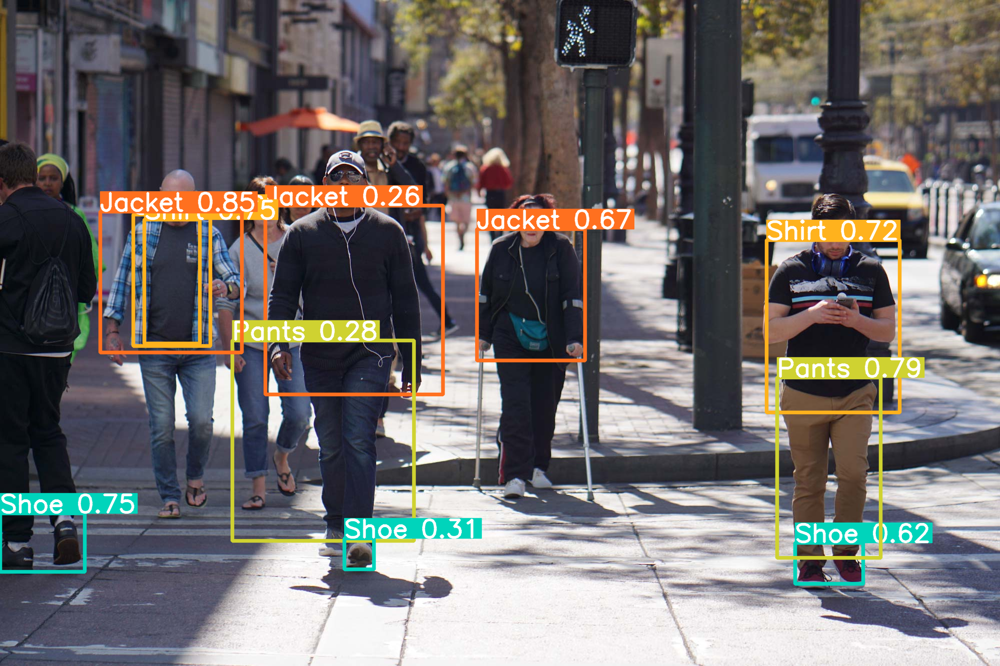

In [46]:
from PIL import Image
results3 = yolo3("/content/drive/MyDrive/people.jpg")
for r in results2:
    im_array = r.plot()
    im = Image.fromarray(im_array[..., ::-1])
    display(im)